# End correction

Read simple.xmen (10mm diameter 1m long), calculate with PIPE/BAFFLE/NONE end correction, then compare.

In [18]:
using DataFrames, DataFramesMeta
using CSV

In [17]:
using Plots
pyplot()

Plots.PyPlotBackend()

In [88]:
using StatPlots

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1189
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/Clustering/Ovl2Q.ji for Clustering [aaaa29a8-35af-508c-8bc3-b662a17a0fe5]
└ @ Base loading.jl:1187
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/KernelDensity/4QyGx.ji for KernelDensity [5ab0869b-81aa-558d-bb23-cbf5423bbe9b]
└ @ Base loading.jl:1187


In [41]:
include("../../src/calcimp.jl")

Main.Calcimp

In [55]:
import .Calcimp

## Simple.xmen

In [35]:
readlines("simple.xmen")

6-element Array{String,1}:
 "# simple tube"  
 "["              
 "    10,10,1000,"
 "    10,0,0,"    
 "]"              
 ""               

MethodError: MethodError: no method matching complete_type(::QuoteNode)
Closest candidates are:
  complete_type(!Matched::Type{#s57} where #s57<:Function) at /home/yoshinobu/.julia/packages/IJulia/4VL8h/src/handlers.jl:57
  complete_type(!Matched::Type{#s57} where #s57<:Type) at /home/yoshinobu/.julia/packages/IJulia/4VL8h/src/handlers.jl:58
  complete_type(!Matched::Type{#s57} where #s57<:Tuple) at /home/yoshinobu/.julia/packages/IJulia/4VL8h/src/handlers.jl:59
  ...

### End correction : PIPE 

In [3]:
prm = initcalcparam()

Dict{Symbol,Any} with 11 entries:
  :stepfreq    => 2.5
  :rho         => 1.18848
  :radiation   => "PIPE"
  :temperature => 24.0
  :nu          => 1.52753e-5
  :maxfreq     => 2000.0
  :c0          => 345.704
  :minfreq     => 0.0
  :mu          => 1.81544e-5
  :dmp         => 1.4714
  :rhoc0       => 410.862

In [8]:
impdata = Calcimp.calcimp("../../sample/simple.xmen");

In [15]:
imp_pipe = @transform(impdata,mg = 20log10.(abs.(:imp)));

In [16]:
head(imp_pipe)

,frq,imp,mg
1,0.0,0.0+0.0im,-Inf
2,2.5,3.20225+22.4761im,27.1217
3,5.0,4.79165+42.9347im,32.7099
4,7.5,6.07926+63.2161im,36.0565
5,10.0,7.24141+83.5969im,38.4763
6,12.5,8.35513+104.245im,40.3889


Compare with result from C version of calcimp.

In [22]:
impc = CSV.read("simple_pipe.imp")
head(impc)

,freq,imp.real,imp.imag,imp.mag
1,0.0,0.0,0.0,0.0
2,2.5,3.20225,22.4761,27.1217
3,5.0,4.79165,42.9347,32.7099
4,7.5,6.07926,63.2161,36.0565
5,10.0,7.24141,83.5969,38.4763
6,12.5,8.35513,104.245,40.3889


In [27]:
imp_pipe[:C] = impc[4];

In [28]:
head(imp_pipe)

,frq,imp,mg,C
1,0.0,0.0+0.0im,-Inf,0.0
2,2.5,3.20225+22.4761im,27.1217,27.1217
3,5.0,4.79165+42.9347im,32.7099,32.7099
4,7.5,6.07926+63.2161im,36.0565,36.0565
5,10.0,7.24141+83.5969im,38.4763,38.4763
6,12.5,8.35513+104.245im,40.3889,40.3889


In [32]:
imp_pipe[:diff] = imp_pipe[:mg] - imp_pipe[:C];

In [33]:
head(imp_pipe)

,frq,imp,mg,C,diff
1,0.0,0.0+0.0im,-Inf,0.0,-Inf
2,2.5,3.20225+22.4761im,27.1217,27.1217,1.58812e-7
3,5.0,4.79165+42.9347im,32.7099,32.7099,-5.27982e-7
4,7.5,6.07926+63.2161im,36.0565,36.0565,2.27514e-7
5,10.0,7.24141+83.5969im,38.4763,38.4763,-1.64453e-8
6,12.5,8.35513+104.245im,40.3889,40.3889,-1.28445e-6


In [34]:
sum(imp_pipe[:diff][2:end])

5.8699480938173565e-6

OK. Both are identical except micro calculation error.

### BAFFLE

Change parameter.

In [36]:
prm[:radiation] = "BAFFLE"

"BAFFLE"

In [37]:
prm

Dict{Symbol,Any} with 11 entries:
  :stepfreq    => 2.5
  :rho         => 1.18848
  :radiation   => "BAFFLE"
  :temperature => 24.0
  :nu          => 1.52753e-5
  :maxfreq     => 2000.0
  :c0          => 345.704
  :minfreq     => 0.0
  :mu          => 1.81544e-5
  :dmp         => 1.4714
  :rhoc0       => 410.862

In [56]:
impdata = Calcimp.calcimp("simple.xmen";prm...);

In [58]:
imp_baffle= @transform(impdata,mg = 20log10.(abs.(:imp)));

Compare with C data.

In [61]:
impc = CSV.read("simple_baffle.imp");

In [62]:
imp_baffle[:C] = impc[4];

In [63]:
imp_baffle[:diff] = imp_baffle[:mg] .- imp_baffle[:C];

In [65]:
sum(imp_baffle[:diff][2:end])

8.574256295190708e-6

Again both calculation are identical.

### End correction : NONE 

In [66]:
prm[:radiation] = "NONE"

"NONE"

In [67]:
prm

Dict{Symbol,Any} with 11 entries:
  :stepfreq    => 2.5
  :rho         => 1.18848
  :radiation   => "NONE"
  :temperature => 24.0
  :nu          => 1.52753e-5
  :maxfreq     => 2000.0
  :c0          => 345.704
  :minfreq     => 0.0
  :mu          => 1.81544e-5
  :dmp         => 1.4714
  :rhoc0       => 410.862

In [79]:
impdata = Calcimp.calcimp("simple.xmen";prm...);

In [80]:
imp_none = @transform(impdata,mg = 20log10.(abs.(:imp)));

In [81]:
head(imp_none)

,frq,imp,mg
1,0.0,0.0+0.0im,-Inf
2,2.5,3.20219+22.4205im,27.1006
3,5.0,4.79135+42.8226im,32.6875
4,7.5,6.07845+63.0458im,36.0333
5,10.0,7.23973+83.3659im,38.4524
6,12.5,8.35213+103.95im,40.3644


In [82]:
impc = CSV.read("simple_none.imp");

In [83]:
imp_none[:C] = impc[4];

In [84]:
imp_none = @transform(imp_none, diff = :mg .- :C);

In [85]:
sum(imp_none[:diff][2:end])

-2.0605739337042905e-13

## Comparison of end correction.

In [86]:
cmpr = DataFrame(frq = imp_pipe[:frq], pipe = imp_pipe[:mg], baffle=imp_baffle[:mg], none=imp_none[:mg]);
head(cmpr)

,frq,pipe,baffle,none
1,0.0,-Inf,-Inf,-Inf
2,2.5,27.1217,27.1307,27.1006
3,5.0,32.7099,32.7195,32.6875
4,7.5,36.0565,36.0665,36.0333
5,10.0,38.4763,38.4865,38.4524
6,12.5,40.3889,40.3994,40.3644


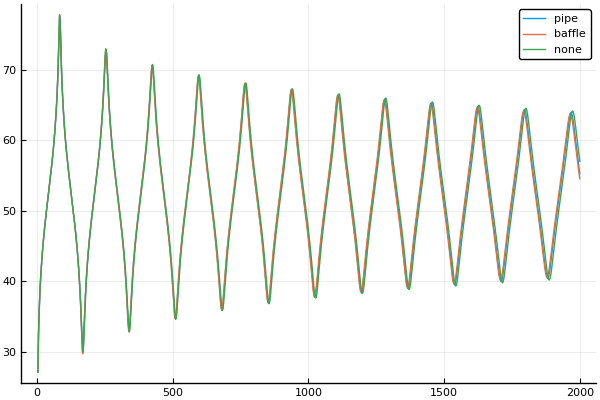

In [89]:
@df cmpr plot(:frq,[:pipe :baffle :none], label = ["pipe" "baffle" "none"])

The effect of end correction is relatively small.